In [1]:
!pip install seaborn
!pip install spacy
!python -m spacy download en_core_web_lg
!pip install -q vaderSentiment
!pip install numpy==1.26.1
!pip install imbalanced-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.7/400.7 MB 82.3 MB/s eta 0:00:0000:0100:01
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_lg')


In [2]:
!pip install pandas
!pip install matplotlib
!pip install s3fs==2023.9.2
import pandas as pd
import s3fs
import gc
import matplotlib.pyplot as plt

In [3]:
import spacy #load spacy
nlp = spacy.load("en_core_web_lg")
print(nlp.pipe_names)
nlp.disable_pipes('ner', 'parser')
print(nlp.pipe_names)

['tok2vec', 'tagger', 'parser', 'attribute_ruler', 'lemmatizer', 'ner']
['tok2vec', 'tagger', 'attribute_ruler', 'lemmatizer']


In [4]:
# File paths for each dataset
s3_bucket_path = 's3://amazon-sagemaker-058264306111-us-east-1-e23504aef6c5/dzd_5l5kah6gnsnq3r/65ql5aektf8rs7/dev/'
business_file_path='s3://amazon-sagemaker-058264306111-us-east-1-e23504aef6c5/dzd_5l5kah6gnsnq3r/65ql5aektf8rs7/dev/yelp_academic_dataset_business.json' #S3 location of business.json
review_file_path='s3://amazon-sagemaker-058264306111-us-east-1-e23504aef6c5/dzd_5l5kah6gnsnq3r/65ql5aektf8rs7/dev/yelp_academic_dataset_review.json'  #S3 location of review.json
user_file_path='s3://amazon-sagemaker-058264306111-us-east-1-e23504aef6c5/dzd_5l5kah6gnsnq3r/65ql5aektf8rs7/dev/yelp_academic_dataset_user.json'

In [5]:
# Reading data
business_df = pd.read_json(business_file_path, lines=True)

In [6]:
# Reading data
review_df = pd.read_json(review_file_path, lines=True, nrows=1500000)

In [7]:
# Select all Walmart businesses except Walmart Vision Center
walmart_business_df = business_df[
    business_df['name'].str.contains('Walmart', case=False) &
    ~business_df['name'].str.contains('Vision Center', case=False)]

# Display the result
walmart_business_df.tail()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
145778,uqayCGXL8mxYgxtDZxUMOw,Walmart Supercenter,16940 -127th Street NW,Edmonton,AB,T6V 1J6,53.631336,-113.544240,1.5,5,1,"{'Caters': 'False', 'AcceptsInsurance': 'None'...","Grocery, Pharmacy, Fashion, Shopping, Health &...","{'Monday': '8:0-23:0', 'Tuesday': '8:0-23:0', ..."
147108,6rC-yu4BBMfPuacFQHveIQ,Walmart Supercenter,3221 W 86th St,Indianapolis,IN,46268,39.909222,-86.216301,1.5,40,1,"{'BusinessAcceptsCreditCards': 'True', 'Busine...","Department Stores, Shopping, Discount Store, G...","{'Monday': '6:0-0:0', 'Tuesday': '6:0-0:0', 'W..."
148634,lJcxw0nbIXx76lFJabEK2A,Walmart Neighborhood Market,5555 Michigan Rd,Indianapolis,IN,46228,39.853351,-86.192553,3.5,12,1,"{'RestaurantsTakeOut': 'False', 'BikeParking':...","Fashion, Electronics, Department Stores, Food,...","{'Monday': '7:0-20:30', 'Tuesday': '6:0-20:30'..."
149314,XQQ5Uyp0iEcau_4o8jDMaQ,Walmart,650 S Trooper Rd,Norristown,PA,19403,40.127503,-75.401567,2.5,16,0,"{'RestaurantsPriceRange2': '1', 'BusinessParki...","Department Stores, Food, Grocery, Mobile Phone...",None
149837,J495vfS5vmGP_H3zuNa4LQ,Walmart Supercenter,18680 S Nogales Hwy,Green Valley,AZ,85614,31.912165,-110.982585,2.0,54,1,"{'RestaurantsPriceRange2': '1', 'BusinessAccep...","Drugstores, Department Stores, Food, Discount ...","{'Monday': '7:0-22:0', 'Tuesday': '7:0-22:0', ..."


In [8]:
target_business_df = business_df[business_df['name'].str.fullmatch('Target', case=False)]
target_business_df

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ..."
192,AzwiKZjVqHOxLaYtPAx8lA,Target,2450 Shoppers Ln,Wyncote,PA,19095,40.076229,-75.155305,2.5,37,1,"{'BusinessParking': '{'garage': False, 'street...","Shopping, Department Stores, Grocery, Fashion,...","{'Monday': '0:0-0:0', 'Tuesday': '7:0-23:59', ..."
2570,6tkLSbQ_EPc6PM9vGrHK8A,Target,6845 Sierra Center Pkwy,Reno,NV,89511,39.463531,-119.780964,3.5,117,1,"{'BusinessAcceptsCreditCards': 'True', 'Restau...","Shopping, Department Stores, Drugstores, Fashi...","{'Monday': '0:0-0:0', 'Tuesday': '7:0-23:59', ..."
3314,odu3pNmc_aqySj5Yh7lFQw,Target,600 Hatton Dr,Glen Mills,PA,19342,39.880780,-75.528000,4.0,24,1,"{'RestaurantsPriceRange2': '2', 'BusinessAccep...","Grocery, Home & Garden, Furniture Stores, Food...","{'Monday': '0:0-0:0', 'Tuesday': '7:0-23:59', ..."
5263,QA1wjE4gcIPP_AuBjB_Y9Q,Target,800 Rock Hill Dr,Bensalem,PA,19020,40.135718,-74.961605,3.0,23,1,"{'BusinessAcceptsCreditCards': 'True', 'WiFi':...","Department Stores, Shopping, Food, Furniture S...","{'Monday': '0:0-0:0', 'Tuesday': '7:0-23:59', ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140834,zyeDagSsnfdVUWIvt8WiqA,Target,1495 Old York Rd,Abington,PA,19001,40.124820,-75.116160,3.0,48,1,"{'BusinessParking': '{'garage': False, 'street...","Fashion, Department Stores, Shopping, Home & G...","{'Monday': '0:0-0:0', 'Tuesday': '7:0-23:59', ..."
146565,bjyLstjkZ9y61Df5Hr8GGw,Target,6814 Charlotte Pike,Nashville,TN,37209,36.135103,-86.891363,3.0,31,1,"{'RestaurantsPriceRange2': '2', 'BusinessAccep...","Grocery, Department Stores, Shopping, Drugstor...","{'Monday': '0:0-0:0', 'Tuesday': '7:0-23:59', ..."
148220,FNjY9rzdB0j-DYuKC0DmOw,Target,4500 Veterans Memorial Blvd,Metairie,LA,70006,30.002898,-90.184112,3.0,92,1,"{'BusinessAcceptsCreditCards': 'True', 'Restau...","Shopping, Sporting Goods, Fashion, Children's ...","{'Monday': '0:0-0:0', 'Tuesday': '7:0-23:59', ..."
148870,RJdRUdjskgGBqE5FFc8tiQ,Target,7150 US 19 N,Pinellas Park,FL,33781,27.836842,-82.684696,3.5,39,1,"{'RestaurantsPriceRange2': '2', 'BusinessParki...","Drugstores, Department Stores, Home & Garden, ...","{'Monday': '0:0-0:0', 'Tuesday': '7:0-23:59', ..."


In [9]:
walmart_business_df.isna().sum()

business_id      0
name             0
address          0
city             0
state            0
postal_code      0
latitude         0
longitude        0
stars            0
review_count     0
is_open          0
attributes      16
categories       0
hours           30
dtype: int64

In [10]:
target_business_df.isna().sum()

business_id     0
name            0
address         0
city            0
state           0
postal_code     0
latitude        0
longitude       0
stars           0
review_count    0
is_open         0
attributes      1
categories      0
hours           2
dtype: int64

In [11]:
#Merge Datasets
merge_walmart_df = review_df.merge(walmart_business_df, on='business_id', how='inner')
merge_target_df = review_df.merge(target_business_df, on='business_id', how='inner')

In [12]:
merge_walmart_df

,review_id,user_id,business_id,stars_x,useful,funny,cool,text,date,name,...,state,postal_code,latitude,longitude,stars_y,review_count,is_open,attributes,categories,hours
0,fE2DRDTFrCFa47tqeYmXlQ,wfi0T-xq_P5sKQvwQitlYg,jgUJ2CkM3LaRHpt3JhKc7g,3,0,0,1,I like to make a stop at this Walmart since it...,2013-01-27 22:49:11,Walmart,...,AB,T5R,53.520337,-113.593785,2.0,9,1,"{'RestaurantsPriceRange2': '2', 'BikeParking':...","Grocery, Department Stores, Shopping, Food, Fa...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ..."
1,p8vrQNWvKJSOkGx2I07aSw,dBCcu2Zi4gT-oOOgBq6YjA,fVKl2yFTh2M6BADfHd2y-w,3,1,0,0,The outside of this Walmart appears to have be...,2016-07-14 22:09:31,Walmart Supercenter,...,FL,34667,28.340456,-82.696861,2.0,21,1,"{'RestaurantsPriceRange2': '1', 'BusinessParki...","Drugstores, Grocery, Shopping, Discount Store,...","{'Monday': '0:0-0:0', 'Tuesday': '0:0-0:0', 'W..."
2,llmHXhuuI9J9WxBovXWdyw,4h4Pmy_SrPPMGer5PU-cIw,OX-Y_c0iZTVNUSzxauiJCg,1,1,0,0,The Optical center at the Springfield location...,2017-08-28 19:27:15,Walmart Supercenter,...,TN,37211,36.041942,-86.709176,2.0,38,1,"{'BikeParking': 'False', 'RestaurantsTakeOut':...","Department Stores, Mobile Phones, Discount Sto...","{'Monday': '6:0-23:0', 'Tuesday': '6:0-23:0', ..."
3,Q2m3697r6-fTLz-FFcMLug,Ajcd-DrakDUQviRW8fdYJw,shi2MHna5oLRSU_rLDJN6A,3,0,0,0,Pretty good and clean Walmart. Lines are long ...,2013-11-14 01:14:21,Walmart Supercenter,...,TN,37209,36.131728,-86.907780,2.0,66,1,"{'RestaurantsPriceRange2': '1', 'BusinessAccep...","Eyewear & Opticians, Drugstores, Shopping, Mob...","{'Monday': '7:0-23:0', 'Tuesday': '7:0-23:0', ..."
4,-siot1HYzSsAq-y71TDLLw,YhHQ3HOsSxjEcMx1GqmRFQ,Rohb8_C1EuwmiTBojwex5Q,1,3,1,0,This store is TERRIBLE. I will only run in fo...,2015-07-28 22:59:10,Walmart Neighborhood Market,...,LA,70058,29.861715,-90.044978,3.0,13,1,"{'RestaurantsPriceRange2': '1', 'BusinessAccep...","Drugstores, Department Stores, Shopping, Groce...","{'Monday': '6:0-23:0', 'Tuesday': '6:0-23:0', ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1598,TARmrNRyqX0VDZqBVs2BAQ,GQ32mErzTq7OGThhXHJtnw,CjR1XUNBmyi9JXxDQ8VdsA,3,0,0,0,If the crowds and poor customer service don't ...,2014-09-11 19:51:10,Walmart,...,TN,37211,36.081346,-86.726692,2.0,22,0,"{'RestaurantsPriceRange2': '2', 'BikeParking':...","Food, Mobile Phones, Fashion, Shopping, Depart...",None
1599,pcDtcn7aJtPfDPQJ6VXAxQ,ftdfs8pQAB5g1p_P7Lqc3Q,CjR1XUNBmyi9JXxDQ8VdsA,1,0,0,0,This is the most NASTIEST and un-organized Wal...,2014-05-27 19:25:28,Walmart,...,TN,37211,36.081346,-86.726692,2.0,22,0,"{'RestaurantsPriceRange2': '2', 'BikeParking':...","Food, Mobile Phones, Fashion, Shopping, Depart...",None
1600,SOCb7wielUE7wYR6d_kJuQ,b6AxbrSpdRVbVPtkzjbT8g,3_icitB518vI8Hr0wEzl8A,4,0,0,0,Lady in the deli was very helpful and friendly...,2017-04-10 09:17:21,Walmart Supercenter,...,NV,89502,39.528923,-119.781683,2.0,158,1,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Grocery, Discount...","{'Monday': '6:0-23:0', 'Tuesday': '7:0-23:0', ..."
1601,cd-XSg6ms_eDaDsVCxTchg,RPPVUEUiUwpMK7IzfqA4Hw,sGzvu5hojpyHhy06vWva6w,2,0,0,0,I don't want to go back. \n\nS-l-o-w ... every...,2017-05-04 21:04:10,Walmart Supercenter,...,MO,63010,38.436770,-90.377898,1.5,12,1,"{'RestaurantsPriceRange2': '1', 'BikeParking':...","Discount Store, Drugstores, Shopping, Fashion,...","{'Monday': '0:0-0:0', 'Tuesday': '0:0-0:0', 'W..."


## Walmart

### Review Processing

In [13]:
merge_walmart_df.columns

Index(['review_id', 'user_id', 'business_id', 'stars_x', 'useful', 'funny',
       'cool', 'text', 'date', 'name', 'address', 'city', 'state',
       'postal_code', 'latitude', 'longitude', 'stars_y', 'review_count',
       'is_open', 'attributes', 'categories', 'hours'],
      dtype='object')

In [14]:
#Walmart reviews
walmart_reviews = pd.DataFrame(merge_walmart_df[['business_id','text','useful','stars_x','stars_y','name','city','state','is_open','review_count','date']])

In [15]:
walmart_reviews.columns

Index(['business_id', 'text', 'useful', 'stars_x', 'stars_y', 'name', 'city',
       'state', 'is_open', 'review_count', 'date'],
      dtype='object')

In [16]:
# Define Custom Stopwords
custom_stopwords = ["walmart", "thing", "get",'store']

In [17]:
def normalize(review, lowercase, remove_stopwords):
    if lowercase:
        review=review.lower()
    doc=nlp(review)
    lemmatize=list()
    for token in doc:
        if not remove_stopwords or (remove_stopwords and token.text not in custom_stopwords and not token.is_stop):
            lemmatize.append(token.lemma_)
    return ' '.join(lemmatize)

In [18]:
import re
#remove non alpha-numeric text
def alpha_text(text):
  return re.sub(r'[^A-Za-z0-9 ]', '', text)

In [19]:
walmart_reviews['text'] = walmart_reviews['text'].apply(alpha_text)
walmart_reviews['processed']=walmart_reviews['text'].apply(normalize, lowercase=True, remove_stopwords=True)
walmart_reviews.head()

,business_id,text,useful,stars_x,stars_y,name,city,state,is_open,review_count,date,processed
0,jgUJ2CkM3LaRHpt3JhKc7g,I like to make a stop at this Walmart since it...,0,3,2.0,Walmart,West Edmonton,AB,1,9,2013-01-27 22:49:11,like stop locate meadowlark doctor office sm...
1,fVKl2yFTh2M6BADfHd2y-w,The outside of this Walmart appears to have be...,1,3,2.0,Walmart Supercenter,Hudson,FL,1,21,2016-07-14 22:09:31,outside appear renovate customer service usual...
2,OX-Y_c0iZTVNUSzxauiJCg,The Optical center at the Springfield location...,1,1,2.0,Walmart Supercenter,Nashville,TN,1,38,2017-08-28 19:27:15,optical center springfield location total ripo...
3,shi2MHna5oLRSU_rLDJN6A,Pretty good and clean Walmart Lines are long a...,0,3,2.0,Walmart Supercenter,Nashville,TN,1,66,2013-11-14 01:14:21,pretty good clean line long usual bit self che...
4,Rohb8_C1EuwmiTBojwex5Q,This store is TERRIBLE I will only run in for...,3,1,3.0,Walmart Neighborhood Market,Harvey,LA,1,13,2015-07-28 22:59:10,terrible run thing absolutely love matte...


In [20]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()
walmart_reviews['processed'] = walmart_reviews["processed"].astype(str)
walmart_reviews['polarity_scores'] = walmart_reviews['processed'].apply(lambda x: analyzer.polarity_scores(x))
walmart_reviews['compound'] = walmart_reviews['polarity_scores'].apply(lambda x: x['compound'])

In [21]:
def sentiment(compound):
    if compound >0.22:
        return 'positive'
    elif compound <-0.04:
        return 'negative'
    else:
        return 'neutral'

In [22]:
walmart_reviews['sentiment']=walmart_reviews['compound'].apply(sentiment)

In [23]:
walmart_reviews.head()

,business_id,text,useful,stars_x,stars_y,name,city,state,is_open,review_count,date,processed,polarity_scores,compound,sentiment
0,jgUJ2CkM3LaRHpt3JhKc7g,I like to make a stop at this Walmart since it...,0,3,2.0,Walmart,West Edmonton,AB,1,9,2013-01-27 22:49:11,like stop locate meadowlark doctor office sm...,"{'neg': 0.101, 'neu': 0.693, 'pos': 0.206, 'co...",0.8818,positive
1,fVKl2yFTh2M6BADfHd2y-w,The outside of this Walmart appears to have be...,1,3,2.0,Walmart Supercenter,Hudson,FL,1,21,2016-07-14 22:09:31,outside appear renovate customer service usual...,"{'neg': 0.165, 'neu': 0.636, 'pos': 0.199, 'co...",0.3476,positive
2,OX-Y_c0iZTVNUSzxauiJCg,The Optical center at the Springfield location...,1,1,2.0,Walmart Supercenter,Nashville,TN,1,38,2017-08-28 19:27:15,optical center springfield location total ripo...,"{'neg': 0.111, 'neu': 0.859, 'pos': 0.03, 'com...",-0.6983,negative
3,shi2MHna5oLRSU_rLDJN6A,Pretty good and clean Walmart Lines are long a...,0,3,2.0,Walmart Supercenter,Nashville,TN,1,66,2013-11-14 01:14:21,pretty good clean line long usual bit self che...,"{'neg': 0.0, 'neu': 0.408, 'pos': 0.592, 'comp...",0.8910,positive
4,Rohb8_C1EuwmiTBojwex5Q,This store is TERRIBLE I will only run in for...,3,1,3.0,Walmart Neighborhood Market,Harvey,LA,1,13,2015-07-28 22:59:10,terrible run thing absolutely love matte...,"{'neg': 0.076, 'neu': 0.592, 'pos': 0.332, 'co...",0.8545,positive


In [24]:
walmart_reviews['is_open'].value_counts()

is_open
1    1557
0      46
Name: count, dtype: int64

In [25]:
from collections import defaultdict, Counter
from spacy.matcher import Matcher
import pprint

### Walmart Exploratory Data Analysis

#### Top 20 Adjectives, Nouns, Verbs

In [26]:
#Prepare for Nouns, Adjs, Verbs,
nouns=[]
verbs=[]
adjs = []

#for loop
for title in walmart_reviews['text']:
  try:
    doc=nlp(title)
    for token in doc:
      if token.pos_ == 'ADJ':
        adjs.append(token.lemma_)
      elif token.pos_ == 'NOUN':
       nouns.append(token.lemma_)
      elif token.pos_ == 'VERB':
        verbs.append(token.lemma_)
  except TypeError:
    pass

In [27]:
#Top 10 Nouns, Adjs, Verbs for Target
noun_counter = Counter(nouns)
verb_counter = Counter(verbs)
adj_counter = Counter (adjs)

print("1. Walmart - Top 20 Nouns:\n")
pprint.pprint(noun_counter.most_common(20))
print("\n")  # Add space between sections

print("2. Walmart - Top 20 Adjectives:\n")
pprint.pprint(adj_counter.most_common(20))
print("\n")  # Add space between sections

print("3. Walmart - Top 20 Verbs:\n")
pprint.pprint(verb_counter.most_common(20))
print("\n")  # Add space between sections

1. Walmart - Top 20 Nouns:

[('store', 1371),
 ('customer', 742),
 ('time', 714),
 ('item', 623),
 ('service', 599),
 ('employee', 576),
 ('line', 559),
 ('people', 509),
 ('location', 366),
 ('manager', 350),
 ('place', 323),
 ('one', 317),
 ('minute', 316),
 ('price', 310),
 ('grocery', 291),
 ('thing', 281),
 ('lot', 280),
 ('cashier', 277),
 ('day', 273),
 ('order', 248)]


2. Walmart - Top 20 Adjectives:

[('other', 395),
 ('good', 369),
 ('bad', 358),
 ('more', 238),
 ('open', 213),
 ('nice', 211),
 ('few', 194),
 ('rude', 178),
 ('clean', 175),
 ('long', 168),
 ('same', 165),
 ('great', 161),
 ('many', 148),
 ('most', 136),
 ('new', 132),
 ('friendly', 131),
 ('well', 131),
 ('sure', 126),
 ('last', 123),
 ('only', 114)]


3. Walmart - Top 20 Verbs:

[('go', 1286),
 ('get', 1114),
 ('say', 686),
 ('need', 577),
 ('find', 493),
 ('come', 456),
 ('tell', 456),
 ('ask', 407),
 ('wait', 400),
 ('know', 391),
 ('make', 389),
 ('look', 374),
 ('take', 357),
 ('shop', 323),
 ('ve', 320

#### Open and Closed Walmart Stores

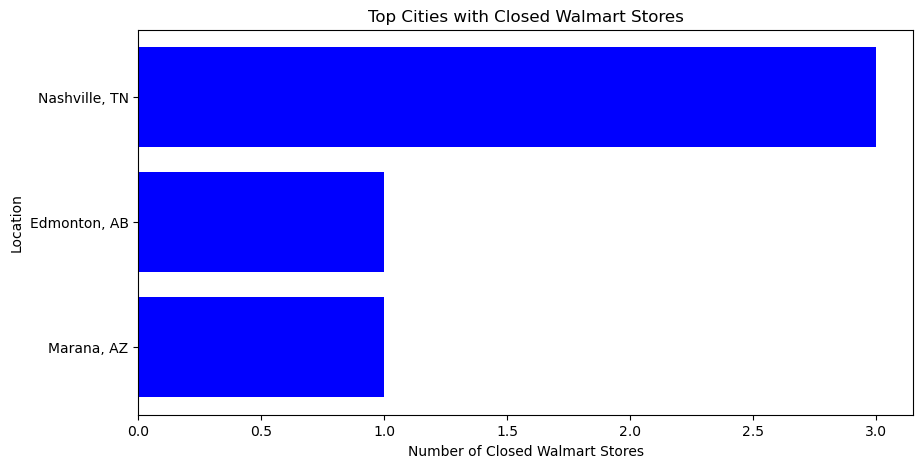

In [28]:
closed_walmart = walmart_reviews[walmart_reviews['is_open'] == 0]

import matplotlib.pyplot as plt

# Group by business_id to count unique closed locations
top_closed_locations = (
    closed_walmart.groupby(['business_id', 'city', 'state'])
    .size()
    .reset_index(name='count')
    .groupby(['city', 'state'])
    .size()
    .reset_index(name='closed_stores')
    .sort_values(by='closed_stores', ascending=False)
)

# Create bar chart
plt.figure(figsize=(10, 5))
plt.barh(
    top_closed_locations.apply(lambda x: f"{x['city']}, {x['state']}", axis=1),
    top_closed_locations['closed_stores'],
    color='blue'
)
plt.xlabel("Number of Closed Walmart Stores")
plt.ylabel("Location")
plt.title("Top Cities with Closed Walmart Stores")
plt.gca().invert_yaxis()  # Invert for better visualization
plt.show()

In [29]:
top_closed_locations

,city,state,closed_stores
2,Nashville,TN,3
0,Edmonton,AB,1
1,Marana,AZ,1


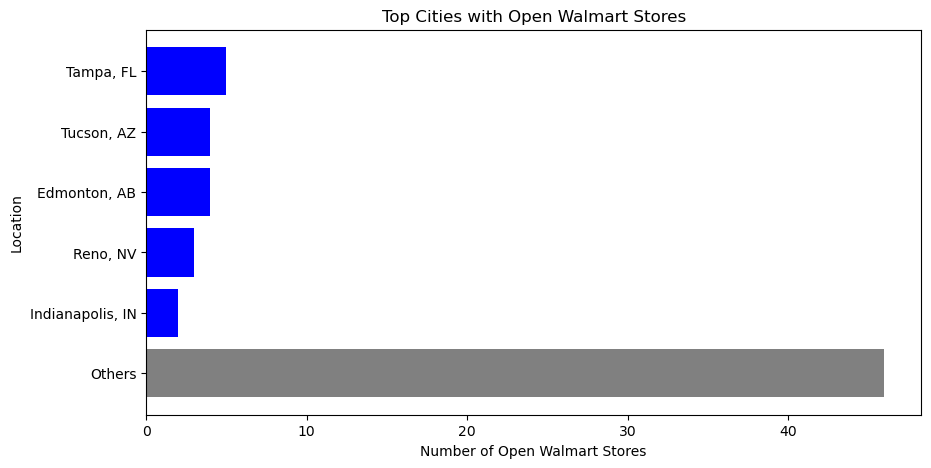

In [30]:
open_walmart = walmart_reviews[walmart_reviews['is_open']==1]

# Group by business_id to count unique open locations
top_open_locations = (
    open_walmart.groupby(['business_id', 'city', 'state'])
    .size()
    .reset_index(name='count')
    .groupby(['city', 'state'])
    .size()
    .reset_index(name='open_stores')
    .sort_values(by='open_stores', ascending=False)
)

# Separate top 5 cities
top_5 = top_open_locations.head(5)

# Merge remaining cities into "Others"
others_count = top_open_locations.iloc[5:]['open_stores'].sum()
others_df = pd.DataFrame({'city': ['Others'], 'state': [''], 'open_stores': [others_count]})

# Combine top 5 with "Others"
final_df = pd.concat([top_5, others_df], ignore_index=True)

# Create bar chart
plt.figure(figsize=(10, 5))
plt.barh(
    final_df.apply(lambda x: f"{x['city']}, {x['state']}" if x['city'] != "Others" else "Others", axis=1),
    final_df['open_stores'],
    color=['blue'] * 5 + ['gray']  # Different color for "Others"
)
plt.xlabel("Number of Open Walmart Stores")
plt.ylabel("Location")
plt.title("Top Cities with Open Walmart Stores")
plt.gca().invert_yaxis()  
plt.show()

In [31]:
top_open_locations.head(10)

,city,state,open_stores
38,Tampa,FL,5
40,Tucson,AZ,4
10,Edmonton,AB,4
33,Reno,NV,3
20,Indianapolis,IN,2
25,Nashville,TN,2
31,Philadelphia,PA,2
46,Woodbury,NJ,2
27,New Orleans,LA,2
1,Arnold,MO,1


In [32]:
# Compute the average of 'stars_y' and 'compound' for closed Walmart locations
average_stars = walmart_reviews['stars_x'].mean()
average_compound = walmart_reviews['compound'].mean()

# Display results
average_stars, average_compound


(2.0923268870867124, 0.13754728633811603)

#### Number of Unique Words (Vocabulary Size)

In [33]:
from nltk.tokenize import word_tokenize
import nltk
nltk.download('punkt_tab')

walmart_reviews['tokens'] = walmart_reviews['text'].dropna().apply(lambda x: word_tokenize(str(x).lower()))

all_words = [word for tokens in walmart_reviews['tokens'] for word in tokens]

vocab_size = len(set(all_words))
print("Number of Unique Words (Vocabulary Size):", vocab_size)

[nltk_data] Downloading package punkt_tab to /home/sagemaker-
[nltk_data]     user/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


Number of Unique Words (Vocabulary Size): 10305


#### Average Review Length

In [34]:
import numpy as np
# Compute review lengths (number of words per review)
walmart_reviews['review_length'] = walmart_reviews['tokens'].apply(len)

# Calculate average review length
average_review_length = np.mean(walmart_reviews['review_length'])

# Print result
print("Average Review Length:", average_review_length)

Average Review Length: 113.67311291328758


#### Number of Tokens

In [35]:
#Token Count
walmart_reviews['token_count']= walmart_reviews['processed'].apply(lambda x: len(x.split()))
total_tokens=walmart_reviews['token_count'].sum()
print("Number of tokens (Target):", total_tokens)

Number of tokens (Target): 74263


#### Average Review Length

In [36]:
walmart_reviews['review_length'] = walmart_reviews['text'].apply(lambda x: len(x.split()))
average_length = walmart_reviews['review_length'].mean()
print('average review length is:', average_length)

average review length is: 113.63630692451653


#### Unique Users Count

In [37]:
unique_users_count = merge_walmart_df['user_id'].nunique()
print('Total number of Walmart users: ', unique_users_count)

Total number of Walmart users:  1449


### Comparison of Customer Totals: Walmart vs Target

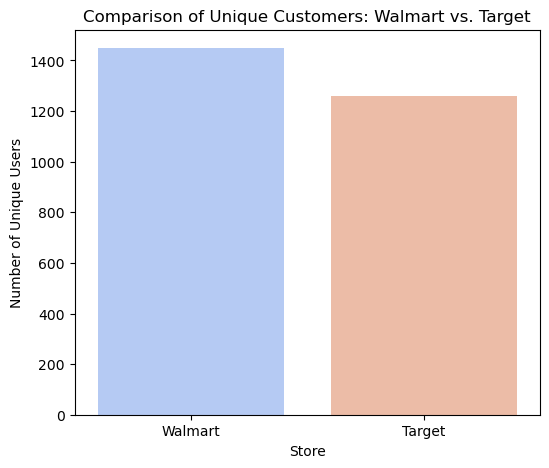

Unique Users for Walmart: 1449
Unique Users for Target: 1259


In [38]:
import seaborn as sns
# Count unique users for each store
unique_users_walmart = merge_walmart_df['user_id'].nunique()
unique_users_target = merge_target_df['user_id'].nunique()

# Create a bar plot
plt.figure(figsize=(6, 5))
sns.barplot(x=['Walmart', 'Target'], y=[unique_users_walmart, unique_users_target], palette='coolwarm')

# Labels and title
plt.xlabel("Store")
plt.ylabel("Number of Unique Users")
plt.title("Comparison of Unique Customers: Walmart vs. Target")
plt.show()

# Print results
print(f"Unique Users for Walmart: {unique_users_walmart}")
print(f"Unique Users for Target: {unique_users_target}")

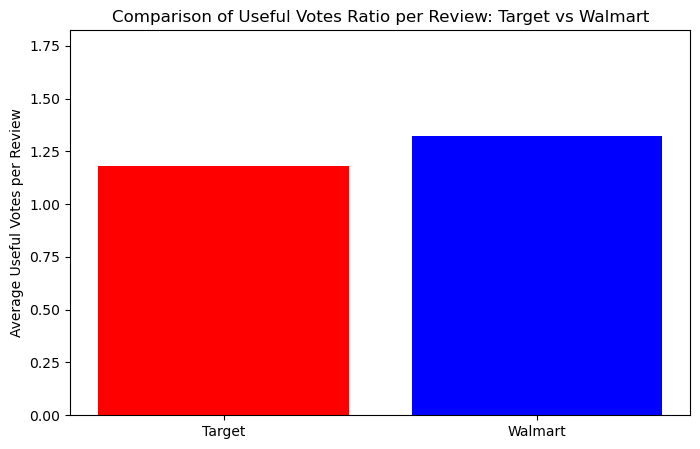

In [39]:
target_useful_ratio = merge_target_df['useful'].sum()/len(merge_target_df)
walmart_useful_ratio = walmart_reviews['useful'].sum()/len(walmart_reviews)

comparison_df=pd.DataFrame({'Store':['Target', 'Walmart'], 'Useful_Ratio':[target_useful_ratio, walmart_useful_ratio]})

# Plot the comparison using a bar chart
plt.figure(figsize=(8, 5))
plt.bar(comparison_df["Store"], comparison_df["Useful_Ratio"], color=["red", "blue"])
plt.ylabel("Average Useful Votes per Review")
plt.title("Comparison of Useful Votes Ratio per Review: Target vs Walmart")
plt.ylim(0, max(comparison_df["Useful_Ratio"]) + 0.5)

# Show the plot
plt.show()

### Machine Learning Model

In [40]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report
import string

In [41]:
#select the independent and target variables
walmart_ml = walmart_reviews[['stars_x','stars_y','useful','is_open','compound']]

X = walmart_ml[['stars_x','stars_y','useful','compound']] 
y = walmart_ml['is_open']

#Scale the Variables
from sklearn.preprocessing import StandardScaler
X=StandardScaler().fit(X).transform(X.astype(float))

In [42]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [43]:
#Apply Resamppling
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_train, y_train = smote.fit_resample(X_train, y_train)

In [44]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Model Training Functions
def train_and_evaluate(ml, X_train, X_test, y_train, y_test):
    ml.fit(X_train, y_train)
    y_pred = ml.predict(X_test)
    
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    cm = confusion_matrix(y_pred, y_test)

    #plot confusion matrix
    plt.figure(figsize=(8,6))
    sns.heatmap(cm, annot=True, fmt='d', cbar=False)
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title('Confusion Matrix')
    plt.show()
    
    print(f"{ml.__class__.__name__} Performance:")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1-score: {f1:.4f}\n")
    print(classification_report(y_test, y_pred))

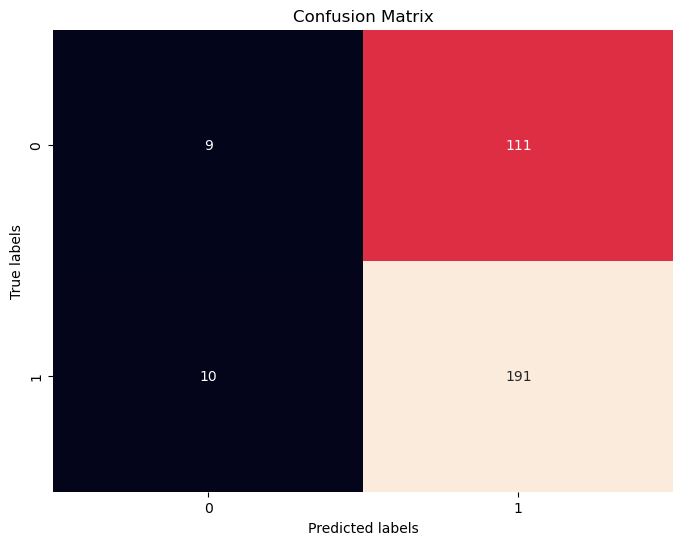

LogisticRegression Performance:
Accuracy: 0.6231
Precision: 0.9502
Recall: 0.6325
F1-score: 0.7594

              precision    recall  f1-score   support

           0       0.07      0.47      0.13        19
           1       0.95      0.63      0.76       302

    accuracy                           0.62       321
   macro avg       0.51      0.55      0.44       321
weighted avg       0.90      0.62      0.72       321



In [45]:
# Train Logistic Regression
log_reg = LogisticRegression(class_weight='balanced')
train_and_evaluate(log_reg, X_train, X_test, y_train, y_test)

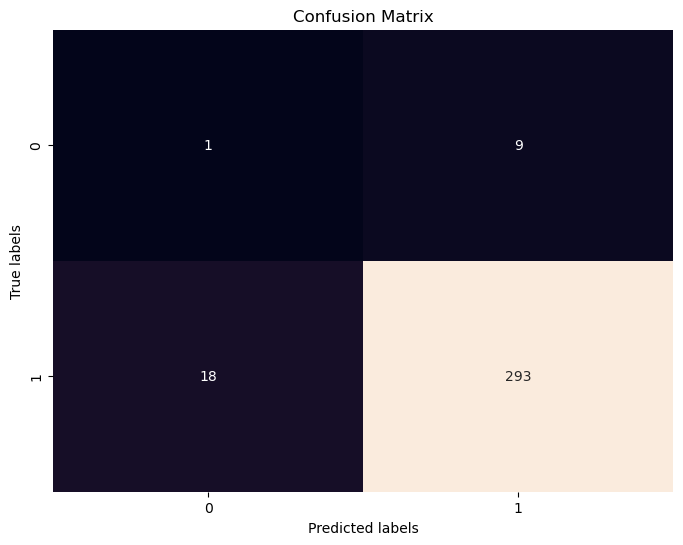

RandomForestClassifier Performance:
Accuracy: 0.9159
Precision: 0.9421
Recall: 0.9702
F1-score: 0.9560

              precision    recall  f1-score   support

           0       0.10      0.05      0.07        19
           1       0.94      0.97      0.96       302

    accuracy                           0.92       321
   macro avg       0.52      0.51      0.51       321
weighted avg       0.89      0.92      0.90       321



In [46]:
# Train Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)
train_and_evaluate(rf, X_train, X_test, y_train, y_test)

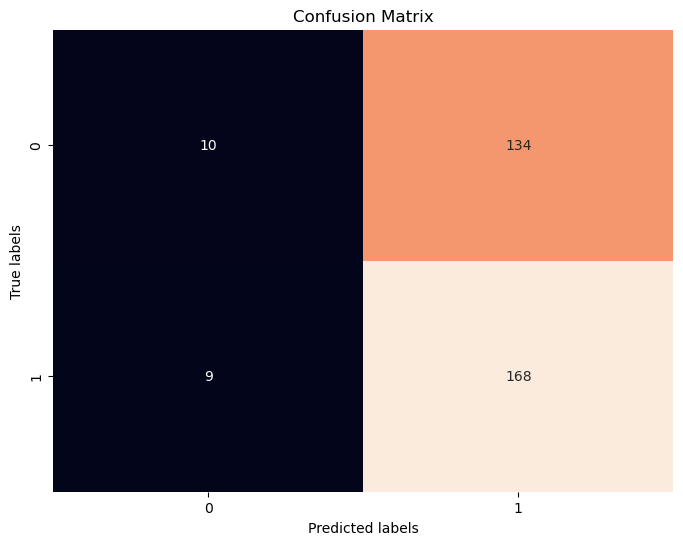

SVC Performance:
Accuracy: 0.5545
Precision: 0.9492
Recall: 0.5563
F1-score: 0.7015

              precision    recall  f1-score   support

           0       0.07      0.53      0.12        19
           1       0.95      0.56      0.70       302

    accuracy                           0.55       321
   macro avg       0.51      0.54      0.41       321
weighted avg       0.90      0.55      0.67       321



In [47]:
# Train Support Vector Machine
svm = SVC(kernel='linear')
train_and_evaluate(svm, X_train, X_test, y_train, y_test)

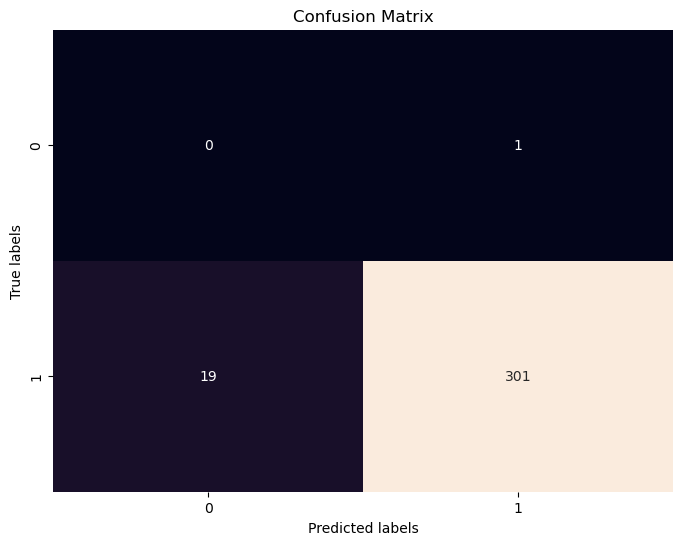

GaussianNB Performance:
Accuracy: 0.9377
Precision: 0.9406
Recall: 0.9967
F1-score: 0.9678

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        19
           1       0.94      1.00      0.97       302

    accuracy                           0.94       321
   macro avg       0.47      0.50      0.48       321
weighted avg       0.88      0.94      0.91       321



In [48]:
# Import Naïve Bayes
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train Naïve Bayes model
nb_model = GaussianNB()
train_and_evaluate(nb_model, X_train, X_test, y_train, y_test)


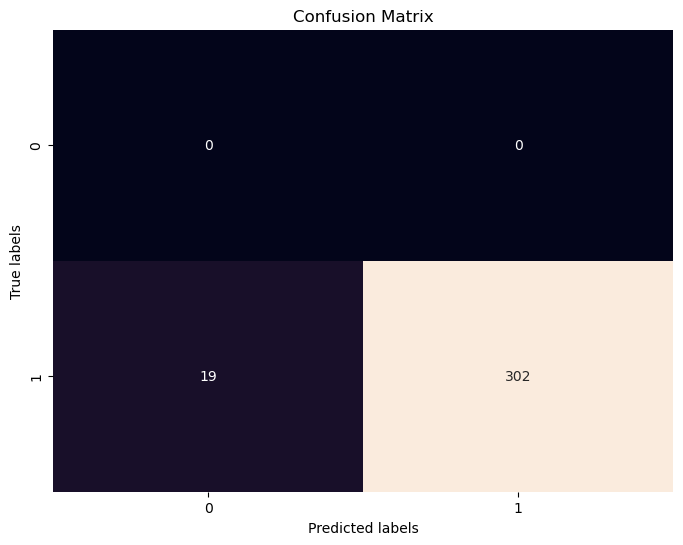

BernoulliNB Performance:
Accuracy: 0.9408
Precision: 0.9408
Recall: 1.0000
F1-score: 0.9695

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        19
           1       0.94      1.00      0.97       302

    accuracy                           0.94       321
   macro avg       0.47      0.50      0.48       321
weighted avg       0.89      0.94      0.91       321



In [49]:
from sklearn.naive_bayes import BernoulliNB

nb = BernoulliNB()
train_and_evaluate(nb, X_train, X_test, y_train, y_test)

Fitting 5 folds for each of 81 candidates, totalling 405 fits
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.1s
[CV] END max_depth=10, min_samp

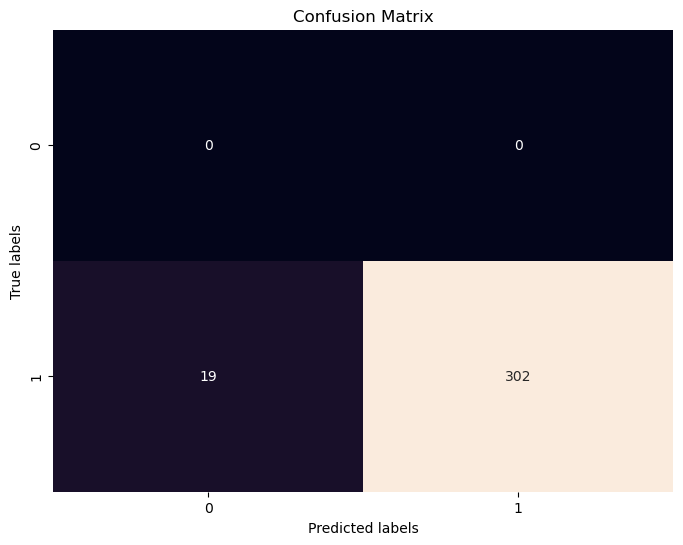

RandomForestClassifier Performance:
Accuracy: 0.9408
Precision: 0.9408
Recall: 1.0000
F1-score: 0.9695

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        19
           1       0.94      1.00      0.97       302

    accuracy                           0.94       321
   macro avg       0.47      0.50      0.48       321
weighted avg       0.89      0.94      0.91       321



In [50]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

# Define hyperparameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Initialize Random Forest Classifier
rf = RandomForestClassifier(random_state=42)

# Perform Grid Search with 5-fold cross-validation
grid_search_rf = GridSearchCV(rf, param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=2)
grid_search_rf.fit(X_train, y_train)

# Print best parameters
print("Best parameters for Random Forest:", grid_search_rf.best_params_)

# Evaluate best model
best_rf = grid_search_rf.best_estimator_
train_and_evaluate(best_rf, X_train, X_test, y_train, y_test)


Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best parameters for Logistic Regression: {'C': 0.5908361216819946, 'penalty': 'l2', 'solver': 'liblinear'}


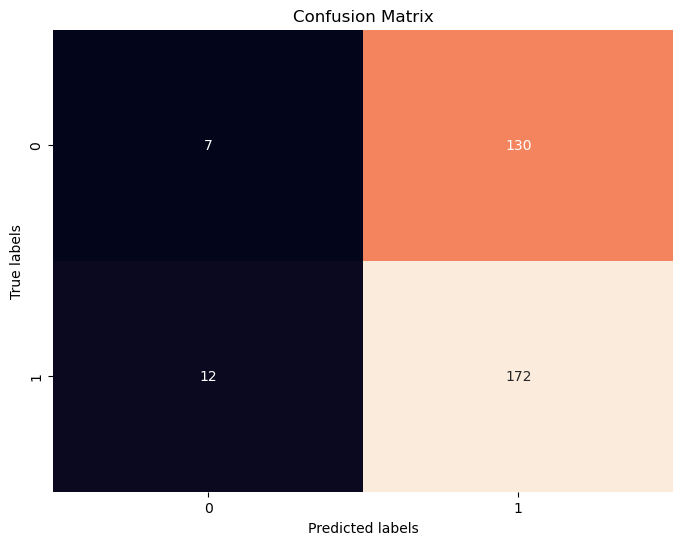

LogisticRegression Performance:
Accuracy: 0.5576
Precision: 0.9348
Recall: 0.5695
F1-score: 0.7078

              precision    recall  f1-score   support

           0       0.05      0.37      0.09        19
           1       0.93      0.57      0.71       302

    accuracy                           0.56       321
   macro avg       0.49      0.47      0.40       321
weighted avg       0.88      0.56      0.67       321



In [51]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform

# Define hyperparameter distribution
param_dist = {
    'C': uniform(0.01, 10),
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear']
}

# Initialize Logistic Regression
log_reg = LogisticRegression(class_weight='balanced', random_state=42)

# Perform Randomized Search
random_search_log = RandomizedSearchCV(log_reg, param_distributions=param_dist, n_iter=20, cv=5, scoring='accuracy', n_jobs=-1, verbose=2, random_state=42)
random_search_log.fit(X_train, y_train)

# Print best parameters
print("Best parameters for Logistic Regression:", random_search_log.best_params_)

# Evaluate best model
best_log_reg = random_search_log.best_estimator_
train_and_evaluate(best_log_reg, X_train, X_test, y_train, y_test)


## Target

### Review Preprocessing

In [52]:
target_reviews = pd.DataFrame(merge_target_df[['business_id','text','useful','stars_x','stars_y','name','city','state','is_open','review_count','date']])

In [53]:
target_reviews.head()

,business_id,text,useful,stars_x,stars_y,name,city,state,is_open,review_count,date
0,YyJ781Cb4ZUlZv35BoBhMw,Probably the best thing about Target is that i...,3,5,3.5,Target,Harvey,LA,1,49,2011-02-14 21:22:22
1,6tkLSbQ_EPc6PM9vGrHK8A,I come here once in awhile to check out their ...,0,3,3.5,Target,Reno,NV,1,117,2012-03-30 14:17:40
2,yKoYrahfJtHnpYXnZMg0eQ,What has happened to Target? I shop weekends ...,0,2,3.5,Target,Tampa,FL,1,52,2018-08-14 09:24:22
3,tUFrWirKiKi_TAnsVWINQQ,We are fans of Target. They seem to have a li...,1,4,3.5,Target,Tucson,AZ,0,22,2017-02-19 15:11:22
4,QA1wjE4gcIPP_AuBjB_Y9Q,I totally live in this target is only few minu...,1,4,3.0,Target,Bensalem,PA,1,23,2018-05-29 03:09:10


In [54]:
custom_stopwords = ['target','store','walmart']

In [55]:
def normalize2(review, lowercase, remove_stopwords):
    if lowercase:
        review=review.lower()
    doc=nlp(review)
    lemmatize=list()
    for token in doc:
        if not remove_stopwords or (remove_stopwords and token.text not in custom_stopwords and not token.is_stop):
            lemmatize.append(token.lemma_)
    return ' '.join(lemmatize)

In [56]:
target_reviews['text'] = target_reviews['text'].apply(alpha_text)
target_reviews['processed']=target_reviews['text'].apply(normalize2, lowercase=True, remove_stopwords=True)
target_reviews.head()

,business_id,text,useful,stars_x,stars_y,name,city,state,is_open,review_count,date,processed
0,YyJ781Cb4ZUlZv35BoBhMw,Probably the best thing about Target is that i...,3,5,3.5,Target,Harvey,LA,1,49,2011-02-14 21:22:22,probably good thing not wal marttarget awesome...
1,6tkLSbQ_EPc6PM9vGrHK8A,I come here once in awhile to check out their ...,0,3,3.5,Target,Reno,NV,1,117,2012-03-30 14:17:40,come awhile check clearance stuff electronic f...
2,yKoYrahfJtHnpYXnZMg0eQ,What has happened to Target I shop weekends a...,0,2,3.5,Target,Tampa,FL,1,52,2018-08-14 09:24:22,happen shop weekend experience start walk ho...
3,tUFrWirKiKi_TAnsVWINQQ,We are fans of Target They seem to have a lit...,1,4,3.5,Target,Tucson,AZ,0,22,2017-02-19 15:11:22,fan little well quality easy u errand ru...
4,QA1wjE4gcIPP_AuBjB_Y9Q,I totally live in this target is only few minu...,1,4,3.0,Target,Bensalem,PA,1,23,2018-05-29 03:09:10,totally live minute away house need reason 4 s...


In [57]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()
target_reviews['processed'] = target_reviews["processed"].astype(str)
target_reviews['polarity_scores'] = target_reviews['processed'].apply(lambda x: analyzer.polarity_scores(x))
target_reviews['compound'] = target_reviews['polarity_scores'].apply(lambda x: x['compound'])


In [58]:
def sentiment(compound):
    if compound >0.22:
        return 'positive'
    elif compound <-0.04:
        return 'negative'
    else:
        return 'neutral'

In [59]:
target_reviews['sentiment']=target_reviews['compound'].apply(sentiment)
target_reviews.head()

,business_id,text,useful,stars_x,stars_y,name,city,state,is_open,review_count,date,processed,polarity_scores,compound,sentiment
0,YyJ781Cb4ZUlZv35BoBhMw,Probably the best thing about Target is that i...,3,5,3.5,Target,Harvey,LA,1,49,2011-02-14 21:22:22,probably good thing not wal marttarget awesome...,"{'neg': 0.113, 'neu': 0.657, 'pos': 0.23, 'com...",0.6914,positive
1,6tkLSbQ_EPc6PM9vGrHK8A,I come here once in awhile to check out their ...,0,3,3.5,Target,Reno,NV,1,117,2012-03-30 14:17:40,come awhile check clearance stuff electronic f...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,neutral
2,yKoYrahfJtHnpYXnZMg0eQ,What has happened to Target I shop weekends a...,0,2,3.5,Target,Tampa,FL,1,52,2018-08-14 09:24:22,happen shop weekend experience start walk ho...,"{'neg': 0.136, 'neu': 0.777, 'pos': 0.086, 'co...",-0.4408,negative
3,tUFrWirKiKi_TAnsVWINQQ,We are fans of Target They seem to have a lit...,1,4,3.5,Target,Tucson,AZ,0,22,2017-02-19 15:11:22,fan little well quality easy u errand ru...,"{'neg': 0.05, 'neu': 0.63, 'pos': 0.32, 'compo...",0.8763,positive
4,QA1wjE4gcIPP_AuBjB_Y9Q,I totally live in this target is only few minu...,1,4,3.0,Target,Bensalem,PA,1,23,2018-05-29 03:09:10,totally live minute away house need reason 4 s...,"{'neg': 0.0, 'neu': 0.8, 'pos': 0.2, 'compound...",0.4588,positive


### Target Exploratory Data Analysis

#### Top 20 Adjectives, Nouns, Verbs

In [60]:
#Prepare for Nouns, Adjs, Verbs,
nouns=[]
verbs=[]
adjs = []

#for loop
for title in target_reviews['text']:
  try:
    doc=nlp(title)
    for token in doc:
      if token.pos_ == 'ADJ':
        adjs.append(token.lemma_)
      elif token.pos_ == 'NOUN':
       nouns.append(token.lemma_)
      elif token.pos_ == 'VERB':
        verbs.append(token.lemma_)
  except TypeError:
    pass

In [61]:
#Top 10 Nouns, Adjs, Verbs for Target
noun_counter = Counter(nouns)
verb_counter = Counter(verbs)
adj_counter = Counter (adjs)

print("1. Target - Top 20 Nouns:\n")
pprint.pprint(noun_counter.most_common(20))
print("\n")  # Add space between sections

print("2. Target - Top 20 Adjectives:\n")
pprint.pprint(adj_counter.most_common(20))
print("\n")  # Add space between sections

print("3. Target - Top 20 Verbs:\n")
pprint.pprint(verb_counter.most_common(20))
print("\n")  # Add space between sections

1. Target - Top 20 Nouns:

[('store', 1202),
 ('item', 578),
 ('time', 524),
 ('target', 524),
 ('customer', 431),
 ('location', 421),
 ('service', 395),
 ('employee', 331),
 ('thing', 301),
 ('price', 254),
 ('staff', 250),
 ('lot', 242),
 ('place', 235),
 ('line', 228),
 ('grocery', 224),
 ('one', 223),
 ('people', 219),
 ('section', 201),
 ('way', 190),
 ('shopping', 184)]


2. Target - Top 20 Adjectives:

[('good', 387),
 ('other', 384),
 ('great', 288),
 ('clean', 288),
 ('nice', 235),
 ('friendly', 205),
 ('more', 197),
 ('bad', 168),
 ('new', 162),
 ('helpful', 152),
 ('few', 144),
 ('well', 134),
 ('big', 134),
 ('little', 132),
 ('many', 113),
 ('same', 111),
 ('most', 106),
 ('easy', 95),
 ('only', 95),
 ('sure', 95)]


3. Target - Top 20 Verbs:

[('go', 825),
 ('get', 743),
 ('find', 501),
 ('need', 453),
 ('say', 370),
 ('look', 353),
 ('come', 343),
 ('m', 334),
 ('make', 333),
 ('ve', 323),
 ('love', 290),
 ('shop', 278),
 ('ask', 235),
 ('know', 235),
 ('see', 227),
 ('h

#### Number of Unique Words (Vocabulary Size)

In [62]:
from nltk.tokenize import word_tokenize
import nltk
nltk.download('punkt_tab')

target_reviews['tokens'] = target_reviews['text'].dropna().apply(lambda x: word_tokenize(str(x).lower()))

all_words = [word for tokens in target_reviews['tokens'] for word in tokens]

vocab_size = len(set(all_words))
print("Number of Unique Words (Vocabulary Size):", vocab_size)

[nltk_data] Downloading package punkt_tab to /home/sagemaker-
[nltk_data]     user/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


Number of Unique Words (Vocabulary Size): 8700


#### Open and Closed Target Stores

In [63]:
closed_target = target_reviews[target_reviews['is_open']==0]

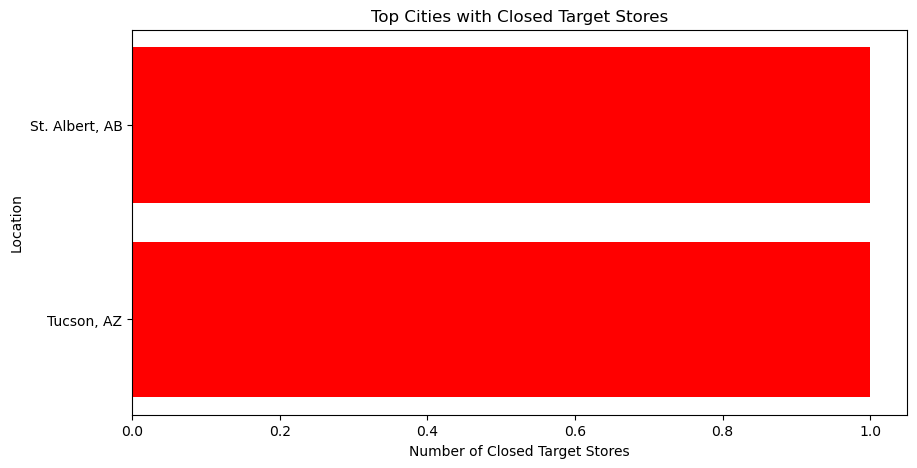

In [64]:
import matplotlib.pyplot as plt

# Group by business_id to count unique closed locations
top_closed_locations = (
    closed_target.groupby(['business_id', 'city', 'state'])
    .size()
    .reset_index(name='count')
    .groupby(['city', 'state'])
    .size()
    .reset_index(name='target_closed_stores')
    .sort_values(by='target_closed_stores', ascending=False)
)

# Create bar chart
plt.figure(figsize=(10, 5))
plt.barh(
    top_closed_locations.apply(lambda x: f"{x['city']}, {x['state']}", axis=1),
    top_closed_locations['target_closed_stores'],
    color='red'
)
plt.xlabel("Number of Closed Target Stores")
plt.ylabel("Location")
plt.title("Top Cities with Closed Target Stores")
plt.gca().invert_yaxis()  # Invert for better visualization
plt.show()


In [65]:
top_closed_locations

,city,state,target_closed_stores
0,St. Albert,AB,1
1,Tucson,AZ,1


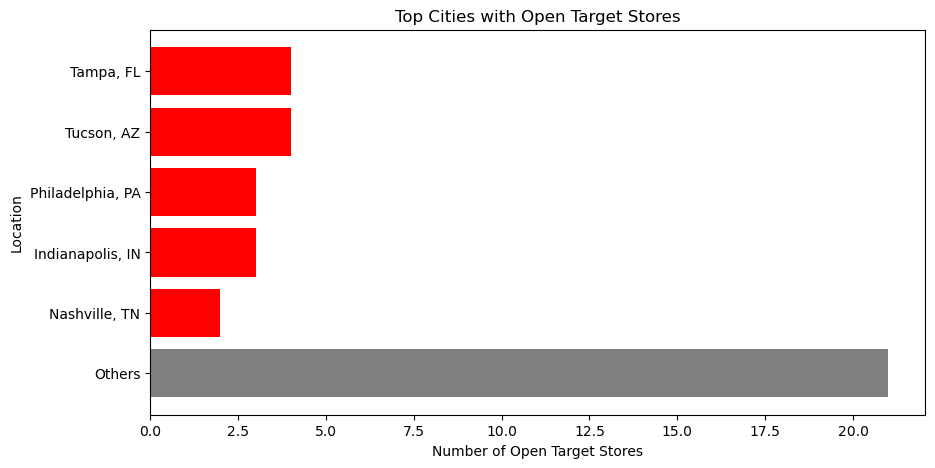

In [67]:
open_target = target_reviews[target_reviews['is_open']==1]
# Group by business_id to count unique open locations
top_open_locations = (
    open_target.groupby(['business_id', 'city', 'state'])
    .size()
    .reset_index(name='count')
    .groupby(['city', 'state'])
    .size()
    .reset_index(name='target_open_stores')
    .sort_values(by='target_open_stores', ascending=False)
)

# Separate top 5 cities
top_5 = top_open_locations.head(5)

# Merge remaining cities into "Others"
others_count = top_open_locations.iloc[5:]['target_open_stores'].sum()
others_df = pd.DataFrame({'city': ['Others'], 'state': [''], 'target_open_stores': [others_count]})

# Combine top 5 with "Others"
final_df = pd.concat([top_5, others_df], ignore_index=True)

# Create bar chart
plt.figure(figsize=(10, 5))
plt.barh(
    final_df.apply(lambda x: f"{x['city']}, {x['state']}" if x['city'] != "Others" else "Others", axis=1),
    final_df['target_open_stores'],
    color=['red'] * 5 + ['gray']  # Different color for "Others"
)
plt.xlabel("Number of Open Target Stores")
plt.ylabel("Location")
plt.title("Top Cities with Open Target Stores")
plt.gca().invert_yaxis()  # Invert for better visualization
plt.show()


In [68]:
top_open_locations

,city,state,target_open_stores
19,Tampa,FL,4
20,Tucson,AZ,4
11,Philadelphia,PA,3
8,Indianapolis,IN,3
10,Nashville,TN,2
18,Springfield,PA,2
0,Bensalem,PA,1
3,Deptford,NJ,1
1,Brandon,FL,1
7,Harvey,LA,1


#### Average Review Length

In [69]:
import numpy as np
# Compute review lengths (number of words per review)
target_reviews['review_length'] = target_reviews['tokens'].apply(len)

# Calculate average review length
average_review_length = np.mean(target_reviews['review_length'])

# Print result
print("Average Review Length:", average_review_length)

Average Review Length: 102.02421129860602


#### Number of Tokens

In [70]:
#Token Count
target_reviews['token_count']=target_reviews['processed'].apply(lambda x: len(x.split()))
total_tokens=target_reviews['token_count'].sum()
print("Number of tokens (Target):", total_tokens)

Number of tokens (Target): 56633


#### Average Review Length

In [71]:
target_reviews['review_length'] = target_reviews['text'].apply(lambda x: len(x.split()))
average_length = target_reviews['review_length'].mean()
print('average review length is:', average_length)

average review length is: 101.99633162142334


#### Unique Users Count

In [72]:
unique_users_count = merge_target_df['user_id'].nunique()
print('Total number of Target users: ', unique_users_count)

Total number of Target users:  1259


### Walmart Target Sentiment Distribution

sentiment
positive    900
negative    635
neutral      68
Name: count, dtype: int64
sentiment
positive    1048
negative     277
neutral       38
Name: count, dtype: int64


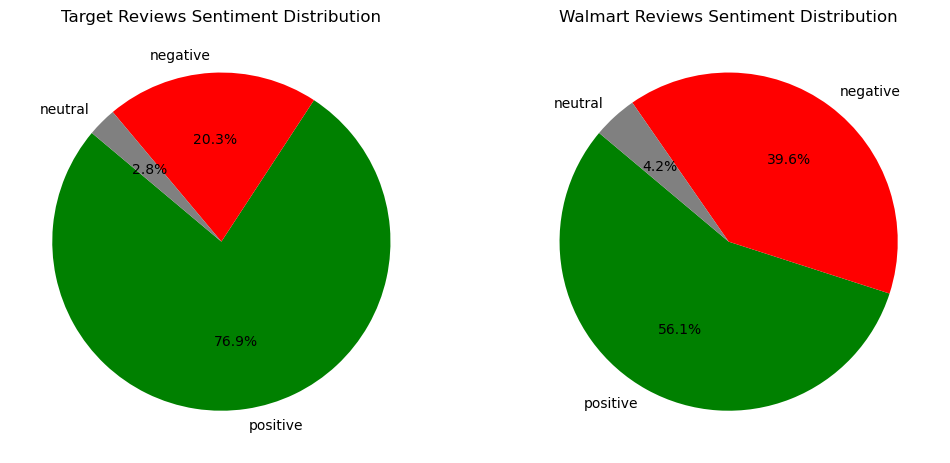

In [73]:
import matplotlib.pyplot as plt
import numpy as np

target_reviews['sentiment']=np.where(target_reviews['compound'] > 0.05, 'positive', np.where(target_reviews['compound']<-0.05,'negative','neutral'))
walmart_reviews['sentiment']=np.where(walmart_reviews['compound'] > 0.05, 'positive', np.where(walmart_reviews['compound']<-0.05,'negative','neutral'))
#Count sentiment distribution for both TARGET AND WALMART
walmart_sentiment_counts=walmart_reviews['sentiment'].value_counts()
target_sentiment_counts=target_reviews['sentiment'].value_counts()
print(walmart_sentiment_counts)
print(target_sentiment_counts)
# Create side-by-side pie charts for sentiment distribution as percentages
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Target Reviews Pie Chart
ax[0].pie(target_sentiment_counts, labels=target_sentiment_counts.index, autopct='%1.1f%%', colors=["green", "red", "gray"], startangle=140)
ax[0].set_title("Target Reviews Sentiment Distribution")

# Walmart Reviews Pie Chart
ax[1].pie(walmart_sentiment_counts, labels=walmart_sentiment_counts.index, autopct='%1.1f%%', colors=["green", "red", "gray"], startangle=140)
ax[1].set_title("Walmart Reviews Sentiment Distribution")

# Display the pie charts
plt.show()


In [75]:
# Compute the average of 'stars_y' and 'compound' for closed Walmart locations
average_stars = target_reviews['stars_x'].mean()
average_compound = target_reviews['compound'].mean()

# Display results
average_stars, average_compound

(3.2157006603081437, 0.4728747615553925)

### Machine Learning Model

In [76]:
#select the independent and target variables
target_ml = target_reviews[['stars_x','stars_y','useful','is_open','compound']]

X = target_ml[['stars_x','stars_y','useful','compound']] 
y = target_ml['is_open']

#Scale the Variables
from sklearn.preprocessing import StandardScaler
X=StandardScaler().fit(X).transform(X.astype(float))

In [77]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [78]:
#Apply Resamppling
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_train, y_train = smote.fit_resample(X_train, y_train)

In [79]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Model Training Functions
def train_and_evaluate(ml, X_train, X_test, y_train, y_test):
    ml.fit(X_train, y_train)
    y_pred = ml.predict(X_test)
    
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    cm = confusion_matrix(y_pred, y_test)

    #plot confusion matrix
    plt.figure(figsize=(8,6))
    sns.heatmap(cm, annot=True, fmt='d', cbar=False)
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title('Confusion Matrix')
    plt.show()
    
    print(f"{ml.__class__.__name__} Performance:")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1-score: {f1:.4f}\n")
    print(classification_report(y_test, y_pred))

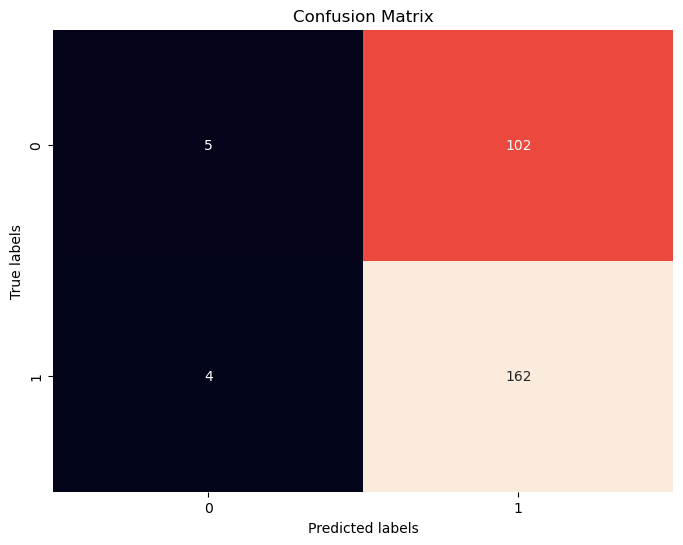

LogisticRegression Performance:
Accuracy: 0.6117
Precision: 0.9759
Recall: 0.6136
F1-score: 0.7535

              precision    recall  f1-score   support

           0       0.05      0.56      0.09         9
           1       0.98      0.61      0.75       264

    accuracy                           0.61       273
   macro avg       0.51      0.58      0.42       273
weighted avg       0.95      0.61      0.73       273



In [80]:
# Train Logistic Regression
log_reg = LogisticRegression(class_weight='balanced')
train_and_evaluate(log_reg, X_train, X_test, y_train, y_test)

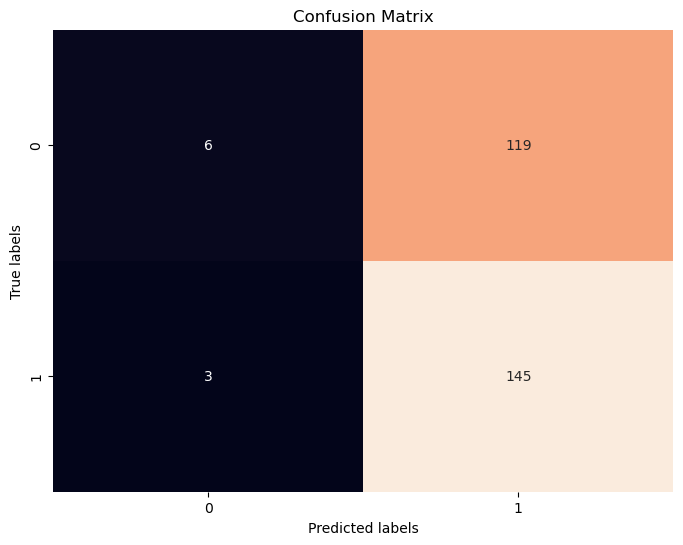

SVC Performance:
Accuracy: 0.5531
Precision: 0.9797
Recall: 0.5492
F1-score: 0.7039

              precision    recall  f1-score   support

           0       0.05      0.67      0.09         9
           1       0.98      0.55      0.70       264

    accuracy                           0.55       273
   macro avg       0.51      0.61      0.40       273
weighted avg       0.95      0.55      0.68       273



In [81]:
# Train Support Vector Machine
svm = SVC(kernel='linear')
train_and_evaluate(svm, X_train, X_test, y_train, y_test)

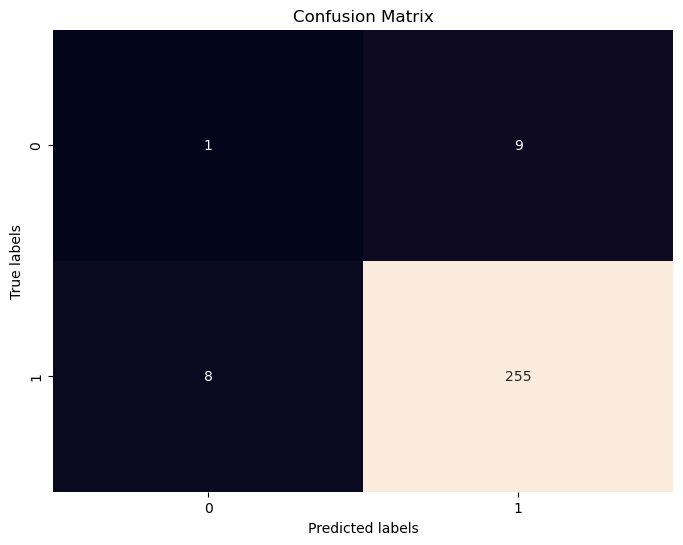

RandomForestClassifier Performance:
Accuracy: 0.9377
Precision: 0.9696
Recall: 0.9659
F1-score: 0.9677

              precision    recall  f1-score   support

           0       0.10      0.11      0.11         9
           1       0.97      0.97      0.97       264

    accuracy                           0.94       273
   macro avg       0.53      0.54      0.54       273
weighted avg       0.94      0.94      0.94       273



In [82]:
# Train Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)
train_and_evaluate(rf, X_train, X_test, y_train, y_test)

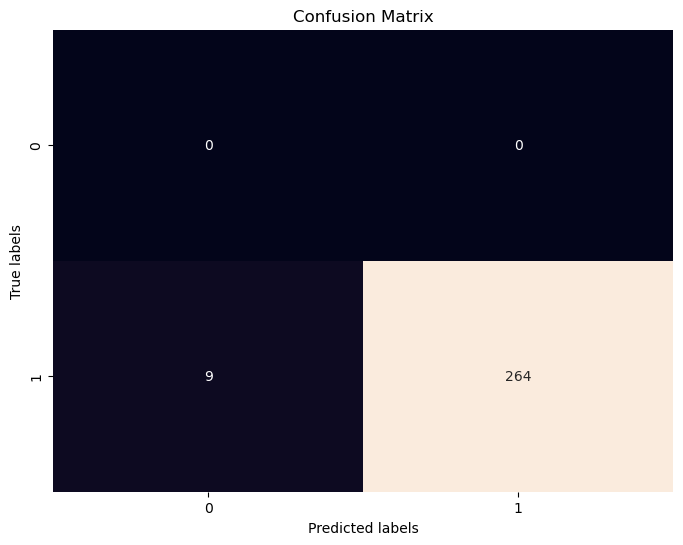

GaussianNB Performance:
Accuracy: 0.9670
Precision: 0.9670
Recall: 1.0000
F1-score: 0.9832

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         9
           1       0.97      1.00      0.98       264

    accuracy                           0.97       273
   macro avg       0.48      0.50      0.49       273
weighted avg       0.94      0.97      0.95       273



In [83]:
# Import Naïve Bayes
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train Naïve Bayes model
nb_model = GaussianNB()
train_and_evaluate(nb_model, X_train, X_test, y_train, y_test)


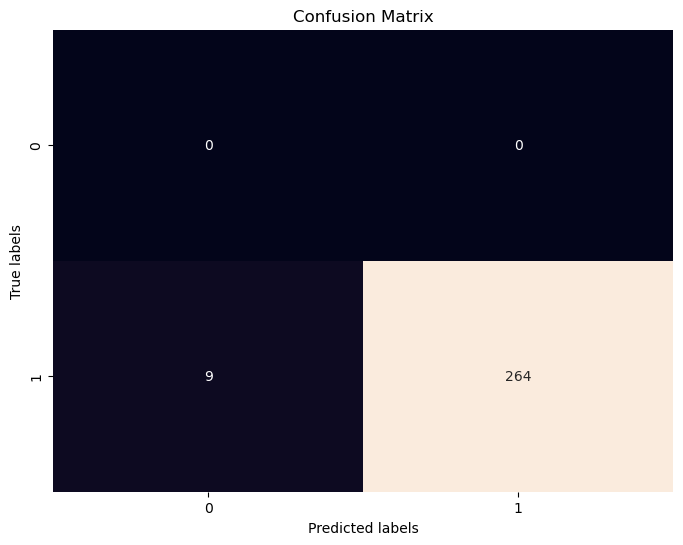

BernoulliNB Performance:
Accuracy: 0.9670
Precision: 0.9670
Recall: 1.0000
F1-score: 0.9832

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         9
           1       0.97      1.00      0.98       264

    accuracy                           0.97       273
   macro avg       0.48      0.50      0.49       273
weighted avg       0.94      0.97      0.95       273



In [84]:
from sklearn.naive_bayes import BernoulliNB

nb = BernoulliNB()
train_and_evaluate(nb, X_train, X_test, y_train, y_test)

Fitting 5 folds for each of 81 candidates, totalling 405 fits

[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.1s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.1s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END 

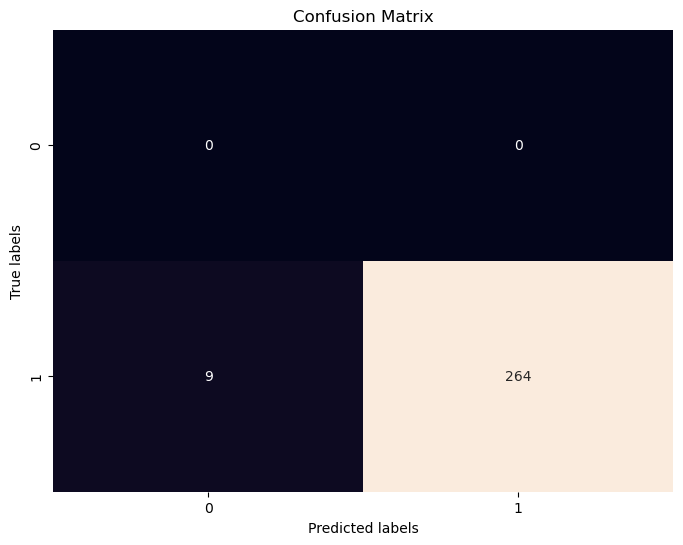

RandomForestClassifier Performance:
Accuracy: 0.9670
Precision: 0.9670
Recall: 1.0000
F1-score: 0.9832

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         9
           1       0.97      1.00      0.98       264

    accuracy                           0.97       273
   macro avg       0.48      0.50      0.49       273
weighted avg       0.94      0.97      0.95       273



In [85]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

# Define hyperparameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Initialize Random Forest Classifier
rf = RandomForestClassifier(random_state=42)

# Perform Grid Search with 5-fold cross-validation
grid_search_rf = GridSearchCV(rf, param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=2)
grid_search_rf.fit(X_train, y_train)

# Print best parameters
print("Best parameters for Random Forest:", grid_search_rf.best_params_)

# Evaluate best model
best_rf = grid_search_rf.best_estimator_
train_and_evaluate(best_rf, X_train, X_test, y_train, y_test)


Fitting 5 folds for each of 20 candidates, totalling 100 fits

[CV] END max_depth=20, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.1s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.1s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.1s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.1s
[CV] END max_depth=20, min_

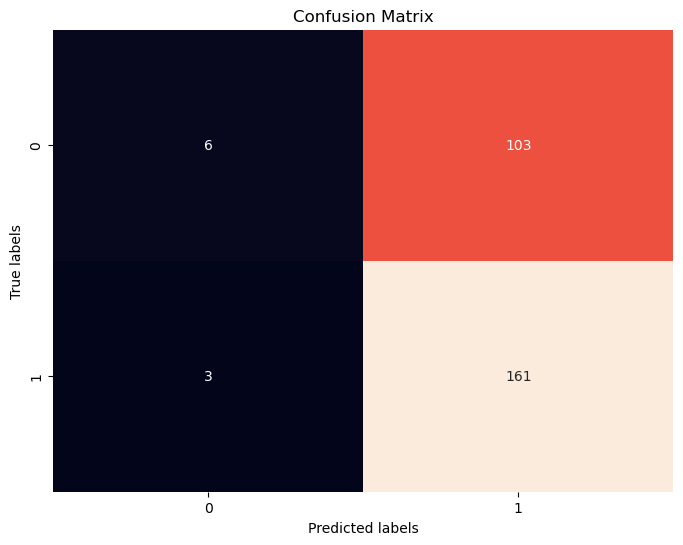

LogisticRegression Performance:
Accuracy: 0.6117
Precision: 0.9817
Recall: 0.6098
F1-score: 0.7523

              precision    recall  f1-score   support

           0       0.06      0.67      0.10         9
           1       0.98      0.61      0.75       264

    accuracy                           0.61       273
   macro avg       0.52      0.64      0.43       273
weighted avg       0.95      0.61      0.73       273



In [86]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform

# Define hyperparameter distribution
param_dist = {
    'C': uniform(0.01, 10),
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear']
}

# Initialize Logistic Regression
log_reg = LogisticRegression(class_weight='balanced', random_state=42)

# Perform Randomized Search
random_search_log = RandomizedSearchCV(log_reg, param_distributions=param_dist, n_iter=20, cv=5, scoring='accuracy', n_jobs=-1, verbose=2, random_state=42)
random_search_log.fit(X_train, y_train)

# Print best parameters
print("Best parameters for Logistic Regression:", random_search_log.best_params_)

# Evaluate best model
best_log_reg = random_search_log.best_estimator_
train_and_evaluate(best_log_reg, X_train, X_test, y_train, y_test)


In [87]:
target_reviews.columns

Index(['business_id', 'text', 'useful', 'stars_x', 'stars_y', 'name', 'city',
       'state', 'is_open', 'review_count', 'date', 'processed',
       'polarity_scores', 'compound', 'sentiment', 'tokens', 'review_length',
       'token_count'],
      dtype='object')

In [88]:
walmart_reviews.columns

Index(['business_id', 'text', 'useful', 'stars_x', 'stars_y', 'name', 'city',
       'state', 'is_open', 'review_count', 'date', 'processed',
       'polarity_scores', 'compound', 'sentiment', 'tokens', 'review_length',
       'token_count'],
      dtype='object')

## WordCloud

In [89]:
!pip install wordcloud

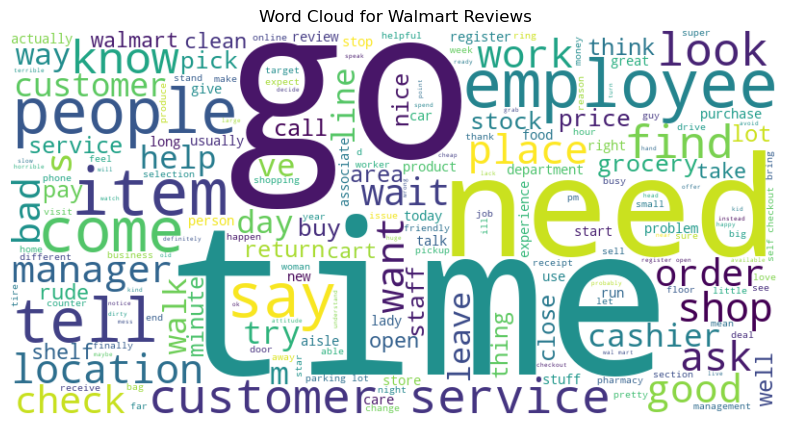

In [90]:
#Walmart
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Combine all processed text into a single string
text_data = " ".join(walmart_reviews['processed'].dropna())

# Generate word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text_data)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Word Cloud for Walmart Reviews")
plt.show()

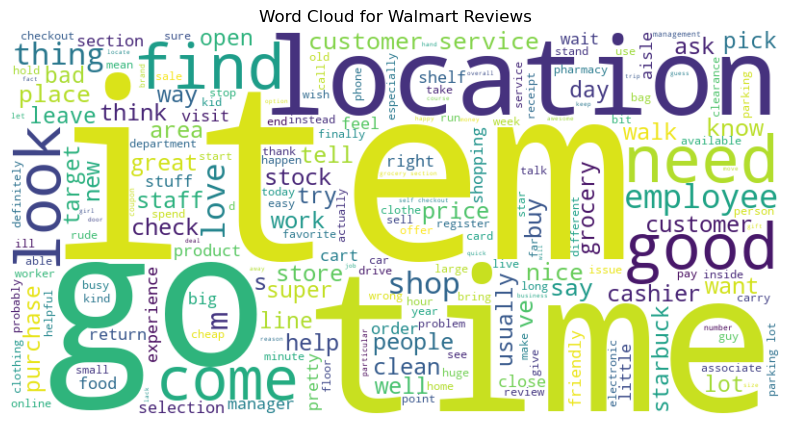

In [91]:
#Target
# Combine all processed text into a single string
text_data = " ".join(target_reviews['processed'].dropna())

# Generate word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text_data)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Word Cloud for Walmart Reviews")
plt.show()

## Target BERT Topic Modelling with UMAP

In [92]:
!pip install bertopic
import os
os.environ['TOKENIZERS_PARALLELISM']='true'

In [93]:
%%time
%matplotlib notebook
from umap import UMAP
umap_model2= UMAP(n_neighbors=15,n_components=7,min_dist=0.0, metric='cosine',random_state=100)

from sklearn.feature_extraction.text import CountVectorizer
from bertopic import BERTopic
vectorizer_model = CountVectorizer(ngram_range=(1,2), min_df=5, max_features=5000, stop_words=custom_stopwords)
model2 = BERTopic(verbose=True,embedding_model='paraphrase-MiniLM-L3-v2', min_topic_size= 5, calculate_probabilities=True, vectorizer_model = vectorizer_model, umap_model=umap_model2)
topics, probs = model2.fit_transform(target_reviews['processed'])

2025-03-05 15:53:01.033470: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-03-05 15:53:01.047392: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-03-05 15:53:01.064623: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-03-05 15:53:01.070264: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-05 15:53:01.084819: I tensorflow/core/platform/cpu_feature_guar

Batches:   0%|          | 0/43 [00:00<?, ?it/s]

2025-03-05 15:53:08,350 - BERTopic - Embedding - Completed ✓
2025-03-05 15:53:08,350 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-03-05 15:53:17,955 - BERTopic - Dimensionality - Completed ✓
2025-03-05 15:53:17,956 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-03-05 15:53:18,140 - BERTopic - Cluster - Completed ✓
2025-03-05 15:53:18,144 - BERTopic - Representation - Extracting topics from clusters using representation models.
2025-03-05 15:53:18,339 - BERTopic - Representation - Completed ✓


CPU times: user 20.9 s, sys: 1.08 s, total: 22 s
Wall time: 21.7 s


In [94]:
model2.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,508,-1_find_not_like_good,"[find, not, like, good, time, need, location, ...",[hard time give big box 5star review come pret...
1,0,181,0_customer_say_service_ask,"[customer, say, service, ask, tell, not, custo...",[christmas eve 122416 go ina thornydale tucson...
2,1,95,1_parking_parking lot_lot_location,"[parking, parking lot, lot, location, not, ve,...",[lot like parking lot people place customer ...
3,2,43,2_bathroom_trash_disgusting_dirty,"[bathroom, trash, disgusting, dirty, floor, re...",[complaint location disgusting bathroom close ...
4,3,32,3_starbucks_coffee_friendly_locate,"[starbucks, coffee, friendly, locate, great, l...",[love cleaner well maintain friendly employee ...
5,4,30,4_love_love love_great_clean,"[love, love love, great, clean, need, home dec...","[dear love love know love possibly need, lov..."
6,5,29,5_food_selection_produce_food section,"[food, selection, produce, food section, fresh...",[ step food department go food run pick ite...
7,6,28,6_pizza_starbucks_area_starbuck,"[pizza, starbucks, area, starbuck, big, cafe, ...",[go rainy day hope shop till rain die decide r...
8,7,28,7_smile_service_worker_help,"[smile, service, worker, help, thank, work, ex...",[customer service location truly amazing brend...
9,8,27,8_love_clearance_item_find,"[love, clearance, item, find, cute, buy, bc, s...",[heart 4ever great quality item fantastic cl...


#### BERT Visualizations

In [95]:
# Visualize the barchart
fig = model2.visualize_barchart(top_n_topics=10,n_words=10,height = 500)
# Display the figure explicitly
fig.show()

In [96]:
docs=target_reviews.processed
classes = target_reviews.stars_x
#topics per class
topics_per_class = model2.topics_per_class(docs, classes=classes)

#visualiz
fig=model2.visualize_topics_per_class(topics_per_class)

fig.show()

5it [00:00, 28.08it/s]


In [97]:
model2.visualize_hierarchy(top_n_topics=20)

In [98]:
hierarchical_topics = model2.hierarchical_topics(target_reviews.processed)

#select top 30 topics
#top_30_topics = hierarchical_topics[:30]

fig= model2.visualize_hierarchical_documents(target_reviews.processed, hierarchical_topics)
fig.show()

100%|██████████| 40/40 [00:00<00:00, 340.18it/s]


Batches:   0%|          | 0/43 [00:00<?, ?it/s]

In [99]:
target_reviews['date'] = pd.to_datetime(target_reviews['date'], format='%Y-%m-%d %H:%M:%S', errors='coerce')

#create topics over time
topics_over_time = model2.topics_over_time(
    target_reviews['processed'], 
    timestamps=target_reviews['date'], 
    nr_bins=10,
    
)

10it [00:00, 33.30it/s]


In [100]:
model2.visualize_topics_over_time(topics_over_time, topics = [0, 1, 2, 3, 4, 5,6,7,8,9])

#### Zero-shot Topic Modelling

In [101]:
from bertopic.representation import KeyBERTInspired
zeroshot_topics = ['customer service', 'cleanliness', 'product availability', 
    'price', 'checkout', 'parking', 'pharmacy',
    'food', 'security', 'complaints']

model2 = BERTopic(embedding_model='thenlper/gte-small',min_topic_size= 5, calculate_probabilities=True, vectorizer_model = vectorizer_model, zeroshot_min_similarity=.50,
                       zeroshot_topic_list=zeroshot_topics,representation_model=KeyBERTInspired(), umap_model=umap_model2)

topics, _ =model2.fit_transform(target_reviews['processed'])

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

In [102]:
model2.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,0,334,0_shopping_grocery_checkout_aisle,"[shopping, grocery, checkout, aisle, self chec...",[pre review ask consideration covid 19 affect ...
1,1,209,1_grocery section_grocery_food_shopping,"[grocery section, grocery, food, shopping, ais...",[not usually crazy experience grocery order th...
2,2,190,2_clean organize_restroom_clean_cashier,"[clean organize, restroom, clean, cashier, sho...",[mess patient understanding especially month d...
3,3,185,3_customer service_customer_cashier_rude,"[customer service, customer, cashier, rude, re...",[terrrrible customer service customer service ...
4,4,120,4_parking lot_parking_grocery_aisle,"[parking lot, parking, grocery, aisle, lot, sh...",[oh fine well close new house small old layout...
5,5,117,5_rude_phone_service_customer,"[rude, phone, service, customer, call, complai...",[0 star bad far come 930 today busy time day p...
6,6,73,6_grocery_find_find item_aisle,"[grocery, find, find item, aisle, shop, invent...",[people work nice stock product convenient m l...
7,7,70,7_shopping_price_grocery_sale,"[shopping, price, grocery, sale, buy, shop, fi...",[easy bike trail price amazing hear open 4 b...
8,8,52,8_pharmacy_grocery_find_service,"[pharmacy, grocery, find, service, call, care,...",[good faith recommend pharmacy past time ve ...
9,9,13,9_wear mask_mask_security_social distancing,"[wear mask, mask, security, social distancing,...",[go little 9 wait let elderly 89 stand watch 3...


In [103]:
# Visualize the barchart
fig = model2.visualize_barchart(top_n_topics=10,n_words=10,height = 500)
# Display the figure explicitly
fig.show()

In [104]:
hierarchical_topics = model2.hierarchical_topics(target_reviews.processed)

#select top 30 topics
#top_30_topics = hierarchical_topics[:30]

fig= model2.visualize_hierarchical_documents(target_reviews.processed, hierarchical_topics, nr_levels=5)
fig.show()

100%|██████████| 9/9 [00:01<00:00,  7.65it/s]


Batches:   0%|          | 0/43 [00:00<?, ?it/s]

In [105]:
model2.visualize_hierarchy(top_n_topics=20)

In [106]:
target_reviews['date'] = pd.to_datetime(target_reviews['date'], format = '%Y-%m-%d %H:%M:%S')

topics_over_time = model2.topics_over_time(target_reviews.processed, timestamps=target_reviews['date'], nr_bins=10)
model2.visualize_topics_over_time(topics_over_time, topics = [0, 1, 2, 3, 4, 5,6,7,8,9,10])

## Walmart BERT Topic w/ UMAP

from umap import UMAP
umap_model = UMAP(n_neighbors =15, n_components =7, min_dist=0.0, metric='cosine',random_state=100)

In [107]:
%%time
%matplotlib notebook
from umap import UMAP
umap_model= UMAP(n_neighbors=15,n_components=7,min_dist=0.0, metric='cosine',random_state=100)

from sklearn.feature_extraction.text import CountVectorizer
from bertopic import BERTopic
vectorizer_model = CountVectorizer(ngram_range=(1,2), stop_words=custom_stopwords, max_features=5000)
model = BERTopic(verbose=True,embedding_model='paraphrase-MiniLM-L3-v2', min_topic_size= 5, calculate_probabilities=True, vectorizer_model = vectorizer_model, umap_model = umap_model)
topics, probs = model.fit_transform(walmart_reviews['processed'])

2025-03-05 15:53:43,262 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/51 [00:00<?, ?it/s]

2025-03-05 15:53:44,068 - BERTopic - Embedding - Completed ✓
2025-03-05 15:53:44,069 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-03-05 15:53:50,244 - BERTopic - Dimensionality - Completed ✓
2025-03-05 15:53:50,245 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-03-05 15:53:50,481 - BERTopic - Cluster - Completed ✓
2025-03-05 15:53:50,484 - BERTopic - Representation - Extracting topics from clusters using representation models.
2025-03-05 15:53:50,783 - BERTopic - Representation - Completed ✓


CPU times: user 8.09 s, sys: 58.6 ms, total: 8.15 s
Wall time: 7.7 s


In [108]:
model.get_document_info(walmart_reviews['processed'])

,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,like stop locate meadowlark doctor office sm...,-1,-1_not_go_find_need,"[not, go, find, need, line, employee, item, ti...",[neighborhood small pack big punch beat dr...,not - go - find - need - line - employee - ite...,0.283004,False
1,outside appear renovate customer service usual...,-1,-1_not_go_find_need,"[not, go, find, need, line, employee, item, ti...",[neighborhood small pack big punch beat dr...,not - go - find - need - line - employee - ite...,0.365920,False
2,optical center springfield location total ripo...,-1,-1_not_go_find_need,"[not, go, find, need, line, employee, item, ti...",[neighborhood small pack big punch beat dr...,not - go - find - need - line - employee - ite...,0.148065,False
3,pretty good clean line long usual bit self che...,6,6_line_lane_long_check,"[line, lane, long, check, checkout, self, open...",[save headache not inside wait 45 minute check...,line - lane - long - check - checkout - self -...,1.000000,False
4,terrible run thing absolutely love matte...,-1,-1_not_go_find_need,"[not, go, find, need, line, employee, item, ti...",[neighborhood small pack big punch beat dr...,not - go - find - need - line - employee - ite...,0.697345,False
...,...,...,...,...,...,...,...,...
1598,crowd poor customer service not bother place s...,-1,-1_not_go_find_need,"[not, go, find, need, line, employee, item, ti...",[neighborhood small pack big punch beat dr...,not - go - find - need - line - employee - ite...,0.096718,False
1599,nasty unorganized ve omg time ve particular lo...,-1,-1_not_go_find_need,"[not, go, find, need, line, employee, item, ti...",[neighborhood small pack big punch beat dr...,not - go - find - need - line - employee - ite...,0.433244,False
1600,lady deli helpful friendly find need blueberry...,-1,-1_not_go_find_need,"[not, go, find, need, line, employee, item, ti...",[neighborhood small pack big punch beat dr...,not - go - find - need - line - employee - ite...,0.682732,False
1601,not want slow process wreturn arrival checko...,-1,-1_not_go_find_need,"[not, go, find, need, line, employee, item, ti...",[neighborhood small pack big punch beat dr...,not - go - find - need - line - employee - ite...,0.175898,False


In [109]:
model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,700,-1_not_go_find_need,"[not, go, find, need, line, employee, item, ti...",[neighborhood small pack big punch beat dr...
1,0,94,0_rude_customer_customer service_service,"[rude, customer, customer service, service, em...",[bad horrible experience today ve shop open cu...
2,1,82,1_shelf_stock_food_produce,"[shelf, stock, food, produce, chicken, grocery...",[horrible shelf stock ve buy bag chicken 2017 ...
3,2,69,2_order_pick_online_email,"[order, pick, online, email, tell, refund, cus...",[2262021i change rating issue get resolve visi...
4,3,33,3_pharmacy_prescription_pharmacist_fill,"[pharmacy, prescription, pharmacist, fill, med...",[review pharmacy location sole high point phar...
5,4,32,4_hate_ve_ghetto_people,"[hate, ve, ghetto, people, fuck, shit, disgust...",[need know not line long lane open live little...
6,5,31,5_parking_parking lot_lot_spot,"[parking, parking lot, lot, spot, parking spot...","[need stock people parking lot friendly, par..."
7,6,30,6_line_lane_long_check,"[line, lane, long, check, checkout, self, open...",[save headache not inside wait 45 minute check...
8,7,29,7_clean_nice_staff_good,"[clean, nice, staff, good, friendly, helpful, ...",[experience today remarkable able walk service...
9,8,28,8_customer service_service_deli_customer,"[customer service, service, deli, customer, ba...",[terribly run bad ve life wait 30 min sporting...


### BERT Visualizations

In [110]:
# Visualize the barchart
fig = model.visualize_barchart(top_n_topics=10,n_words=10,height = 500)
# Display the figure explicitly
fig.show()

In [111]:
hierarchical_topics = model.hierarchical_topics(walmart_reviews.processed)

#select top 30 topics
top_30_topics = hierarchical_topics[:30]

fig= model.visualize_hierarchical_documents(walmart_reviews.processed, top_30_topics)
fig.show()

100%|██████████| 45/45 [00:00<00:00, 315.21it/s]


Batches:   0%|          | 0/51 [00:00<?, ?it/s]

In [112]:
model.visualize_hierarchy(top_n_topics=20)

In [113]:
#convert format to datetime
walmart_reviews['date'] = pd.to_datetime(walmart_reviews['date'], format='%Y-%m-%d %H:%M:%S', errors='coerce')

#create topics over time
topics_over_time = model.topics_over_time(
    walmart_reviews['processed'], 
    timestamps=walmart_reviews['date'], 
    nr_bins=10,
    
)

10it [00:00, 21.00it/s]


In [114]:
model.visualize_topics_over_time(topics_over_time, topics =[0,1,2,3,4,5,6,8,9,22,25])

In [115]:
docs=walmart_reviews.processed
classes = walmart_reviews.stars_x

#topics per class
topics_per_star = model.topics_per_class(docs,classes=classes)

fig=model.visualize_topics_per_class(topics_per_star)
fig

5it [00:00, 22.22it/s]


### Zero-shot Topic Modelling

In [116]:
from bertopic.representation import KeyBERTInspired
zeroshot_topics = ['customer service', 'cleanliness', 'product availability', 
    'price', 'checkout', 'parking', 'pharmacy',
    'food', 'security', 'complaints']

model = BERTopic(embedding_model='thenlper/gte-small',min_topic_size= 5, calculate_probabilities=True, vectorizer_model = vectorizer_model, zeroshot_min_similarity=.50,
                       zeroshot_topic_list=zeroshot_topics,representation_model=KeyBERTInspired(), umap_model=umap_model)

topics, _ =model.fit_transform(walmart_reviews['processed'])

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

In [117]:
model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,0,351,0_checkout line_shopping_self checkout_cashier,"[checkout line, shopping, self checkout, cashi...",[today bad experience retail long time ignor...
1,1,280,1_bad customer_customer service_customer_service,"[bad customer, customer service, customer, ser...",[order radio flyer tricycle online option free...
2,2,266,2_rude_cashier_customer_employee,"[rude, cashier, customer, employee, problem, r...",[awful employee rude helpful sketchy place nic...
3,3,211,3_grocery_shopping_aisle_food,"[grocery, shopping, aisle, food, cashier, find...",[like stop locate meadowlark doctor office s...
4,4,158,4_restroom_clean_dirty_filthy,"[restroom, clean, dirty, filthy, cashier, bath...",[year ago give star sweat day definitely not...
5,5,107,5_parking lot_parking spot_parking_grocery,"[parking lot, parking spot, parking, grocery, ...",[star go grocery pick reason hot not want car ...
6,6,76,6_price good_price_find_grocery,"[price good, price, find, grocery, shopping, m...",[place somewhat close house price good like ba...
7,7,72,7_pharmacy_prescription ready_pharmacist_presc...,"[pharmacy, prescription ready, pharmacist, pre...",[store nashville think necessarily quality loc...
8,8,56,8_find_grocery_inventory_shop,"[find, grocery, inventory, shop, not find, pur...",[ve go move bellevue mixed experience recent...
9,9,26,9_security guard_walk need_shopper_tell employee,"[security guard, walk need, shopper, tell empl...",[week arrival notice employee outside shopping...


In [118]:
model.get_document_info(walmart_reviews['processed'])

,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,like stop locate meadowlark doctor office sm...,3,3_grocery_shopping_aisle_food,"[grocery, shopping, aisle, food, cashier, find...",[like stop locate meadowlark doctor office s...,grocery - shopping - aisle - food - cashier - ...,0.938363,True
1,outside appear renovate customer service usual...,1,1_bad customer_customer service_customer_service,"[bad customer, customer service, customer, ser...",[order radio flyer tricycle online option free...,bad customer - customer service - customer - s...,0.915466,False
2,optical center springfield location total ripo...,6,6_price good_price_find_grocery,"[price good, price, find, grocery, shopping, m...",[place somewhat close house price good like ba...,price good - price - find - grocery - shopping...,0.914527,False
3,pretty good clean line long usual bit self che...,0,0_checkout line_shopping_self checkout_cashier,"[checkout line, shopping, self checkout, cashi...",[today bad experience retail long time ignor...,checkout line - shopping - self checkout - cas...,0.896815,False
4,terrible run thing absolutely love matte...,5,5_parking lot_parking spot_parking_grocery,"[parking lot, parking spot, parking, grocery, ...",[star go grocery pick reason hot not want car ...,parking lot - parking spot - parking - grocery...,0.923415,False
...,...,...,...,...,...,...,...,...
1598,crowd poor customer service not bother place s...,1,1_bad customer_customer service_customer_service,"[bad customer, customer service, customer, ser...",[order radio flyer tricycle online option free...,bad customer - customer service - customer - s...,0.937174,False
1599,nasty unorganized ve omg time ve particular lo...,3,3_grocery_shopping_aisle_food,"[grocery, shopping, aisle, food, cashier, find...",[like stop locate meadowlark doctor office s...,grocery - shopping - aisle - food - cashier - ...,0.930683,False
1600,lady deli helpful friendly find need blueberry...,3,3_grocery_shopping_aisle_food,"[grocery, shopping, aisle, food, cashier, find...",[like stop locate meadowlark doctor office s...,grocery - shopping - aisle - food - cashier - ...,0.919784,False
1601,not want slow process wreturn arrival checko...,0,0_checkout line_shopping_self checkout_cashier,"[checkout line, shopping, self checkout, cashi...",[today bad experience retail long time ignor...,checkout line - shopping - self checkout - cas...,0.932500,False


In [119]:
fig = model.visualize_barchart(top_n_topics=10,n_words=10,height = 500)
# Display the figure explicitly
fig.show()

In [120]:
docs=walmart_reviews.processed
classes = walmart_reviews.stars_x

#topics per class
topics_per_star = model.topics_per_class(docs,classes=classes)

fig=model.visualize_topics_per_class(topics_per_star)
fig

In [121]:
#convert format to datetime
walmart_reviews['date'] = pd.to_datetime(walmart_reviews['date'], format='%Y-%m-%d %H:%M:%S', errors='coerce')

#create topics over time
topics_over_time = model.topics_over_time(
    walmart_reviews['processed'], 
    timestamps=walmart_reviews['date'], 
    nr_bins=10,
    
)

In [122]:
model.visualize_topics_over_time(topics_over_time, topics =[0,1,2,3,4,5,6,8,9,22,25])

In [123]:
#END OF PAGE